In [1]:
import torch 
print(torch.__version__)

1.10.2+cu113


In [2]:
%cd detectron2

/storage/Projects/notebooks/detectron2/detectron2


In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random,pickle

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor,DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import MetadataCatalog, DatasetCatalog,build_detection_test_loader, build_detection_train_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode
import detectron2.data.transforms as T
from detectron2.data import detection_utils as utils
from detectron2.data import datasets
from detectron2 import model_zoo

In [4]:
import torch
torch.cuda.is_available()

True

In [5]:
def cv2_imshow(im):
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.figure(), plt.imshow(im), plt.axis('off');

In [6]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from matplotlib.pyplot import imshow
from PIL import Image
import IPython
def cv2_imshow(img):
    img = img[:,:,[2,1,0]]
    img = Image.fromarray(img)
    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [7]:
train_dataset_name = 'trafficsigns'
train_image_path = "/storage/Projects/Fylkesveg/Sign_training_material/training_sahi/images/train/"
train_json_annot_path = "/storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/train/coco.json"
f = open(train_json_annot_path, 'r')
train_annotations = json.load(f)
f.close()
num_classes = len(train_annotations['categories'])

In [8]:
test_dataset_name = 'trafficsigns_test'
test_image_path = '/storage/Projects/Fylkesveg/Sign_training_material/training_sahi/images/valid'
test_json_annot_path = "/storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/valid/coco.json"
f = open(train_json_annot_path, 'r')
train_annotations = json.load(f)
f.close()
num_classes = len(train_annotations['categories'])

In [9]:
cfg_save_path =  'IS_cfg.pickle'
training_dict = datasets.load_coco_json(train_json_annot_path, train_image_path,
                dataset_name=train_dataset_name)

[09/26 09:10:05 d2.data.datasets.coco]: Loaded 8598 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/train/coco.json


In [10]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances(train_dataset_name, {}, train_json_annot_path, train_image_path)
register_coco_instances(test_dataset_name, {}, test_json_annot_path, test_image_path)

In [11]:
trafficsigns_metadata = MetadataCatalog.get("trafficsigns")
dataset_dicts = DatasetCatalog.get("trafficsigns")

[09/26 09:10:12 d2.data.datasets.coco]: Loaded 8598 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/train/coco.json


In [12]:
trafficsigns_metadata = MetadataCatalog.get("trafficsigns")
dataset_dicts = DatasetCatalog.get("trafficsigns")

[09/26 09:10:15 d2.data.datasets.coco]: Loaded 8598 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/train/coco.json


In [13]:
print(type(trafficsigns_metadata))
MetadataCatalog.get("trafficsigns")

<class 'detectron2.data.catalog.Metadata'>


namespace(name='trafficsigns',
          thing_classes=['red_triangle',
                         'white_square',
                         'red_circle',
                         'blue_square',
                         'right_of_way',
                         'red_blue_circle',
                         'yellow_black_marker',
                         'yield_bakside',
                         'red_square',
                         'blue_circle',
                         'direction',
                         'yield',
                         'zone_start',
                         'big_direction',
                         'zone_end',
                         'blue_white_square',
                         'tunnelmarkers',
                         'red_circle_end',
                         'brown_direction',
                         'brown_square'],
          thing_dataset_id_to_contiguous_id={1: 0,
                                             2: 1,
                                             

In [17]:
cfg = get_cfg()
device = 'cuda'
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("trafficsigns",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False
#cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/FAIR/X-101-32x8d.pkl"  # Let training initialize from model zoo
cfg.MODEL.WEIGHTS =  model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR =  0.00025 
cfg.SOLVER.MAX_ITER = 270000  
cfg.SOLVER.STEPS = (210000, 250000)       
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 20
cfg.INPUT.MIN_SIZE_TRAIN = [640,672,704,736,768,800]
cfg.OUTPUT_DIR = 'output/trafficsigns_X101-FPN/'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)



In [18]:
yaml_cfg_path = 'output/trafficsigns_X101-FPN/cfg.yaml'
with open(yaml_cfg_path, 'w') as yaml_cfg_file:
  yaml_cfg_file.write(cfg.dump())

In [ ]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[09/26 09:15:46 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_2d9806.pkl: 431MB [00:36, 11.9MB/s]                               
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (21, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (21,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (80, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (80,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model 

[09/26 09:16:24 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[09/26 09:16:31 d2.utils.events]:  eta: 1 day, 0:03:36  iter: 19  total_loss: 4.181  loss_cls: 2.899  loss_box_reg: 0.5207  loss_mask: 0.6871  loss_rpn_cls: 0.02614  loss_rpn_loc: 0.005948  time: 0.3235  data_time: 0.0334  lr: 4.9952e-06  max_mem: 2953M
[09/26 09:16:38 d2.utils.events]:  eta: 1 day, 0:00:57  iter: 39  total_loss: 3.832  loss_cls: 2.701  loss_box_reg: 0.3426  loss_mask: 0.6888  loss_rpn_cls: 0.05861  loss_rpn_loc: 0.008434  time: 0.3235  data_time: 0.0023  lr: 9.9902e-06  max_mem: 3190M
[09/26 09:16:44 d2.utils.events]:  eta: 1 day, 0:01:53  iter: 59  total_loss: 3.328  loss_cls: 2.316  loss_box_reg: 0.3112  loss_mask: 0.6867  loss_rpn_cls: 0.08477  loss_rpn_loc: 0.009694  time: 0.3241  data_time: 0.0023  lr: 1.4985e-05  max_mem: 3190M
[09/26 09:16:51 d2.utils.events]:  eta: 23:59:15  iter: 79  total_loss: 2.919  loss_cls: 1.786  loss_box_reg: 0.2843  loss_mask: 0.6842  loss_rpn_cls: 0.06462  loss_rpn_loc: 0.006722  time: 0.3233  data_time: 0.0024  lr: 1.998e-05  max_me

In [21]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("trafficsigns", )
predictor = DefaultPredictor(cfg)

[09/28 09:33:34 d2.data.datasets.coco]: Loaded 8598 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/train/coco.json


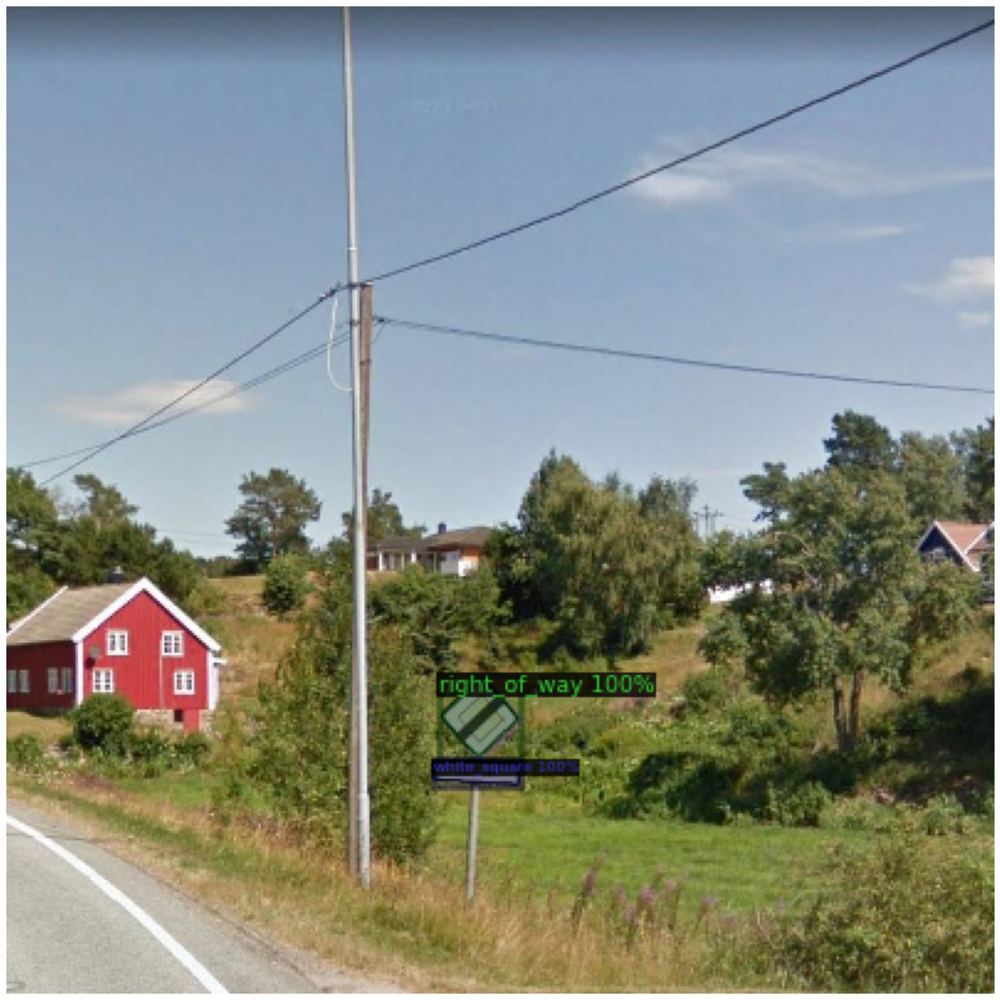

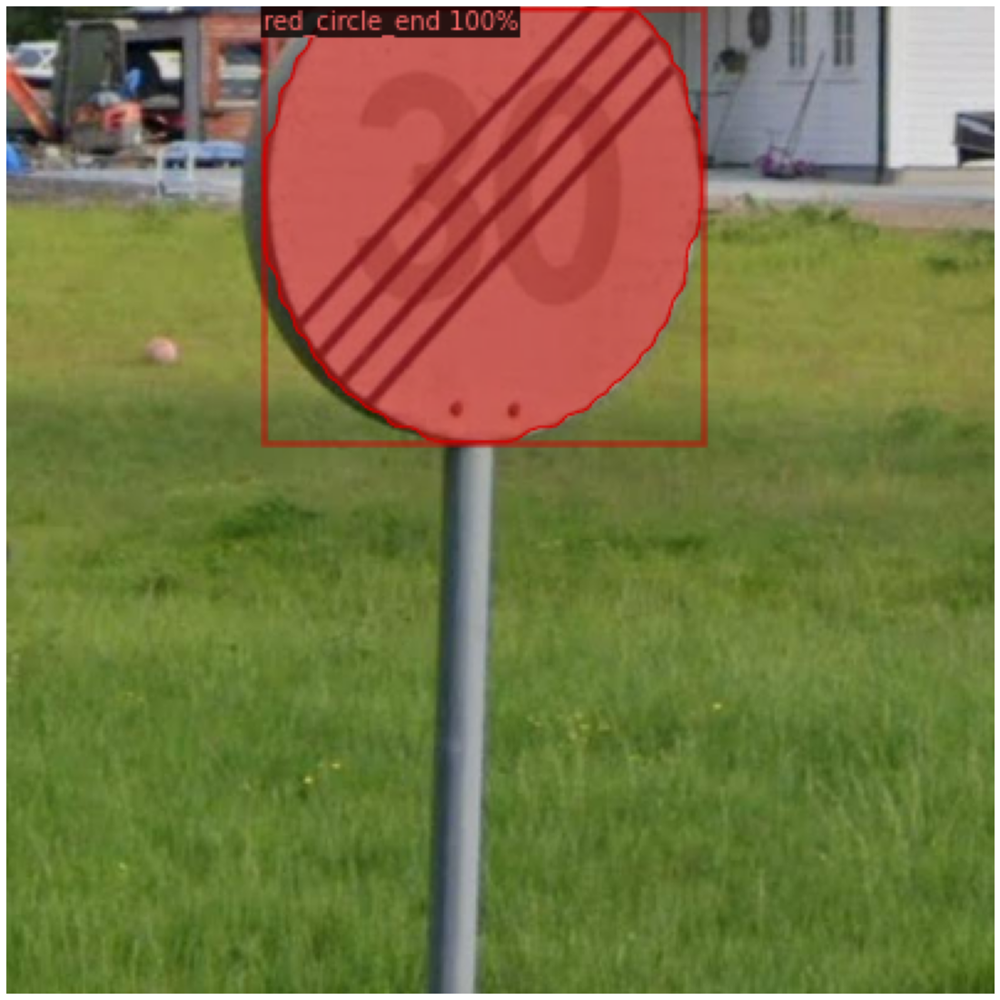

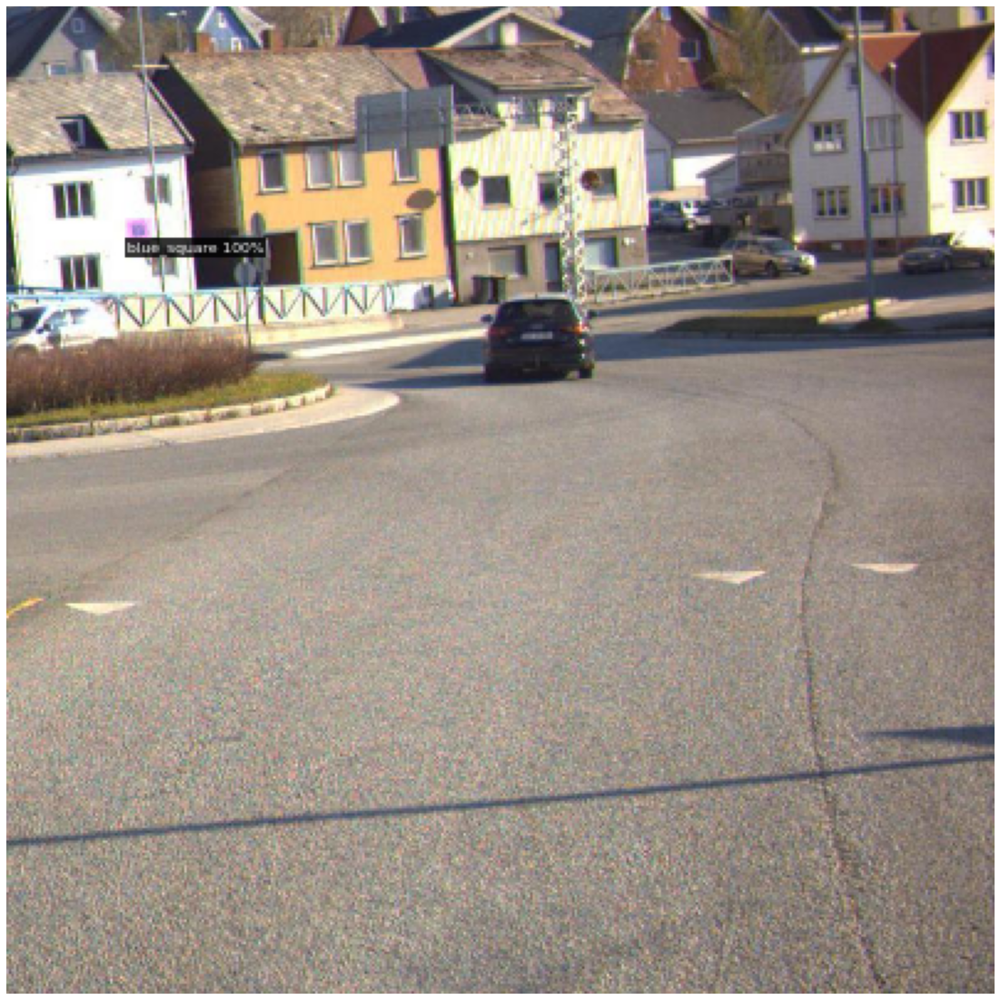

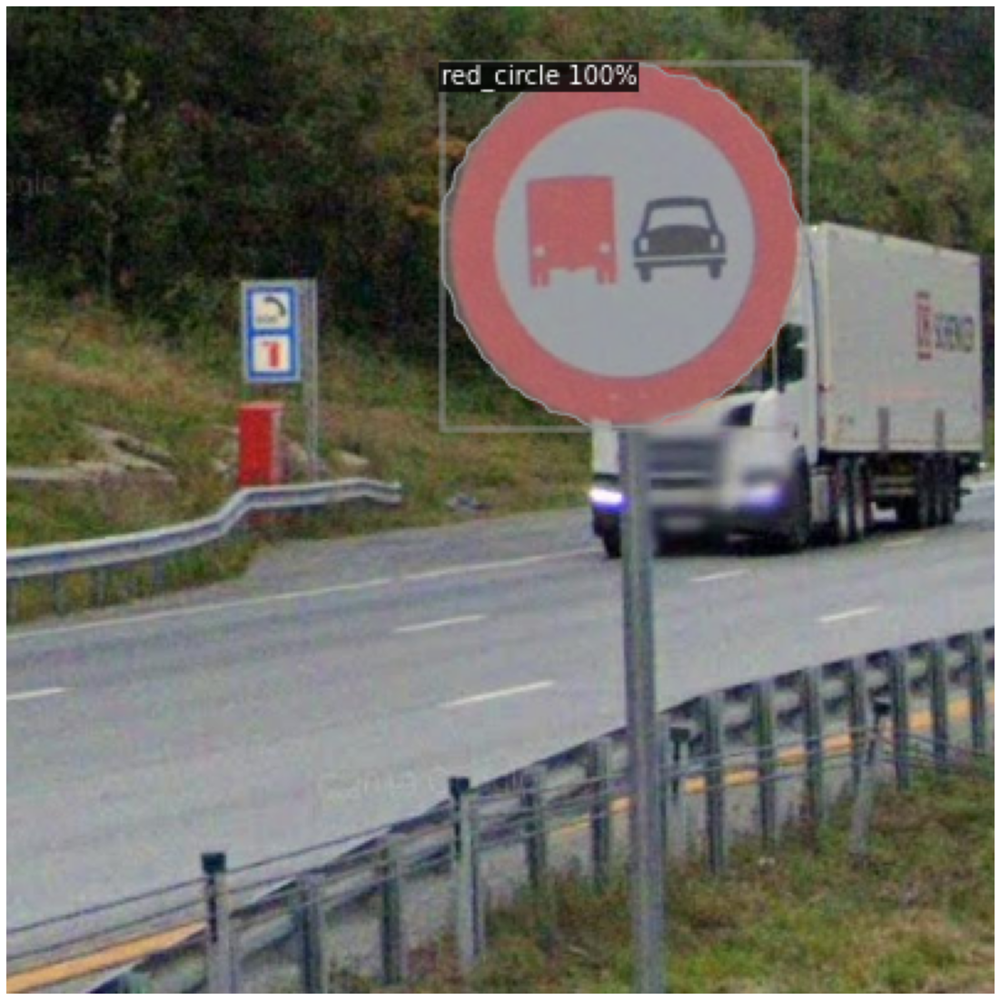

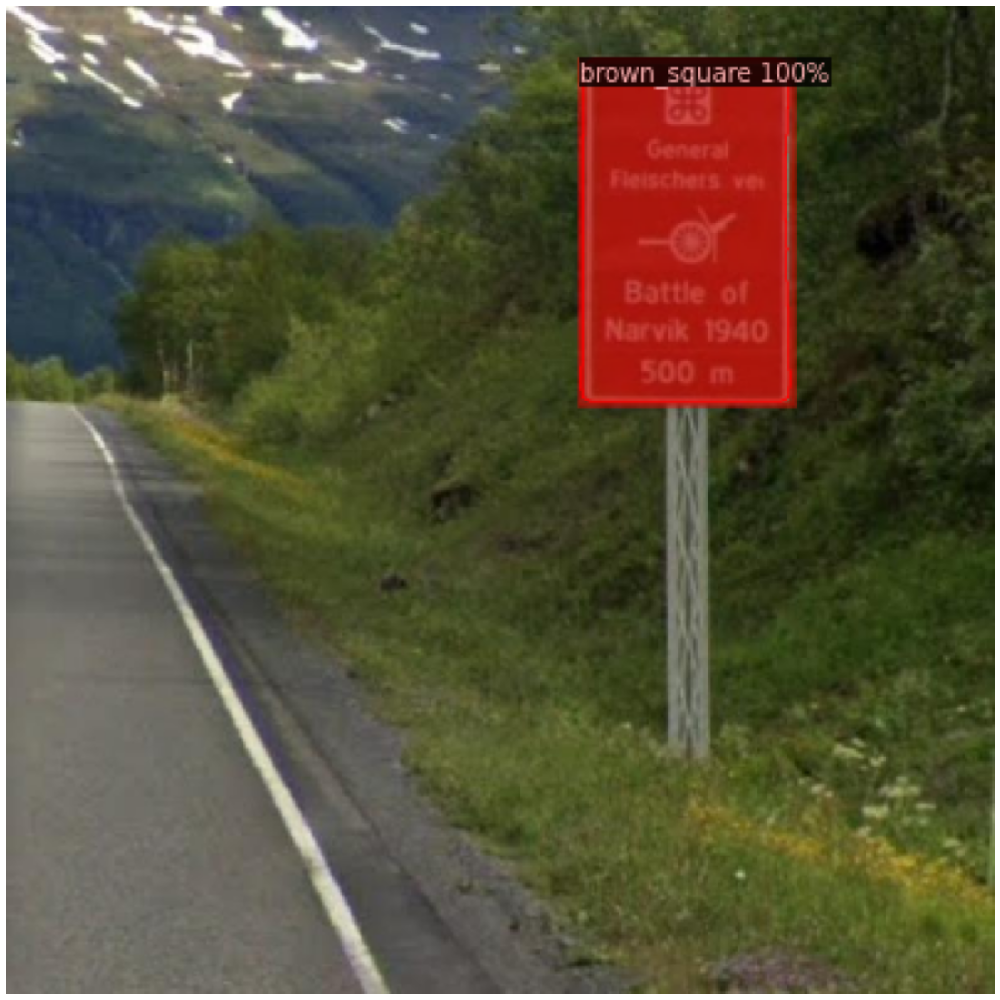

In [47]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("trafficsigns")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=trafficsigns_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE  # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [23]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("trafficsigns", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "trafficsigns")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[09/27 12:38:00 d2.data.datasets.coco]: Loaded 8598 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/train/coco.json
[09/27 12:38:01 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/27 12:38:01 d2.data.common]: Serializing 8598 elements to byte tensors and concatenating them all ...
[09/27 12:38:01 d2.data.common]: Serialized dataset takes 3.70 MiB
[09/27 12:38:01 d2.evaluation.evaluator]: Start inference on 8598 batches
[09/27 12:38:03 d2.evaluation.evaluator]: Inference done 11/8598. Dataloading: 0.0008 s/iter. Inference: 0.1071 s/iter. Eval: 0.0054 s/iter. Total: 0.1133 s/iter. ETA=0:16:12
[09/27 12:38:08 d2.evaluation.evaluator]: Inference done 55/8598. Dataloading: 0.0014 s/iter. Inference: 0.1078 s/iter. Eval: 0.0051 s/iter. Total: 0.1144 s/iter. ETA=0:16:17
[09/27 12:38:13 d2.evaluation.evaluator]: Inference done 

In [ ]:
#Test Samples

In [24]:
trafficsigns_metadata = MetadataCatalog.get("trafficsigns_test")
dataset_dicts = DatasetCatalog.get("trafficsigns_test")

[09/27 12:58:26 d2.data.datasets.coco]: Loaded 2358 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/valid/coco.json


In [25]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("trafficsigns_test", )
predictor = DefaultPredictor(cfg)

In [26]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("trafficsigns_test", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "trafficsigns_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[09/27 12:59:21 d2.data.datasets.coco]: Loaded 2358 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/valid/coco.json
[09/27 12:59:21 d2.data.build]: Distribution of instances among all 20 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
| red_triangle  | 760          | white_square  | 502          |  red_circle   | 676          |
|  blue_square  | 469          | right_of_way  | 85           | red_blue_ci.. | 99           |
| yellow_blac.. | 91           | yield_bakside | 83           |  red_square   | 24           |
|  blue_circle  | 126          |   direction   | 199          |     yield     | 140          |
|  zone_start   | 75           | big_direction | 22           |   zone_end    | 45           |
| blue_white_.. | 129          | tunnelmarkers | 82           | red_circle_.. | 43   

[09/28 09:34:00 d2.data.datasets.coco]: Loaded 2358 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/valid/coco.json


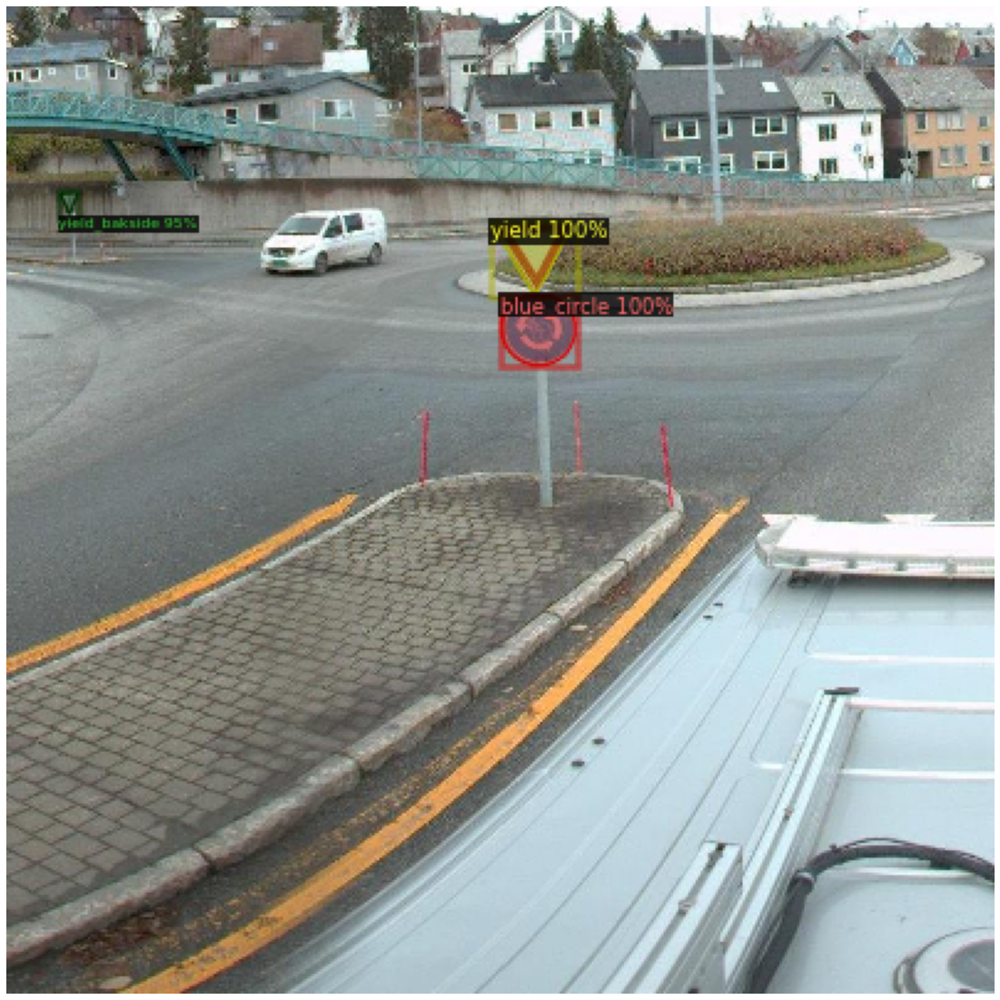

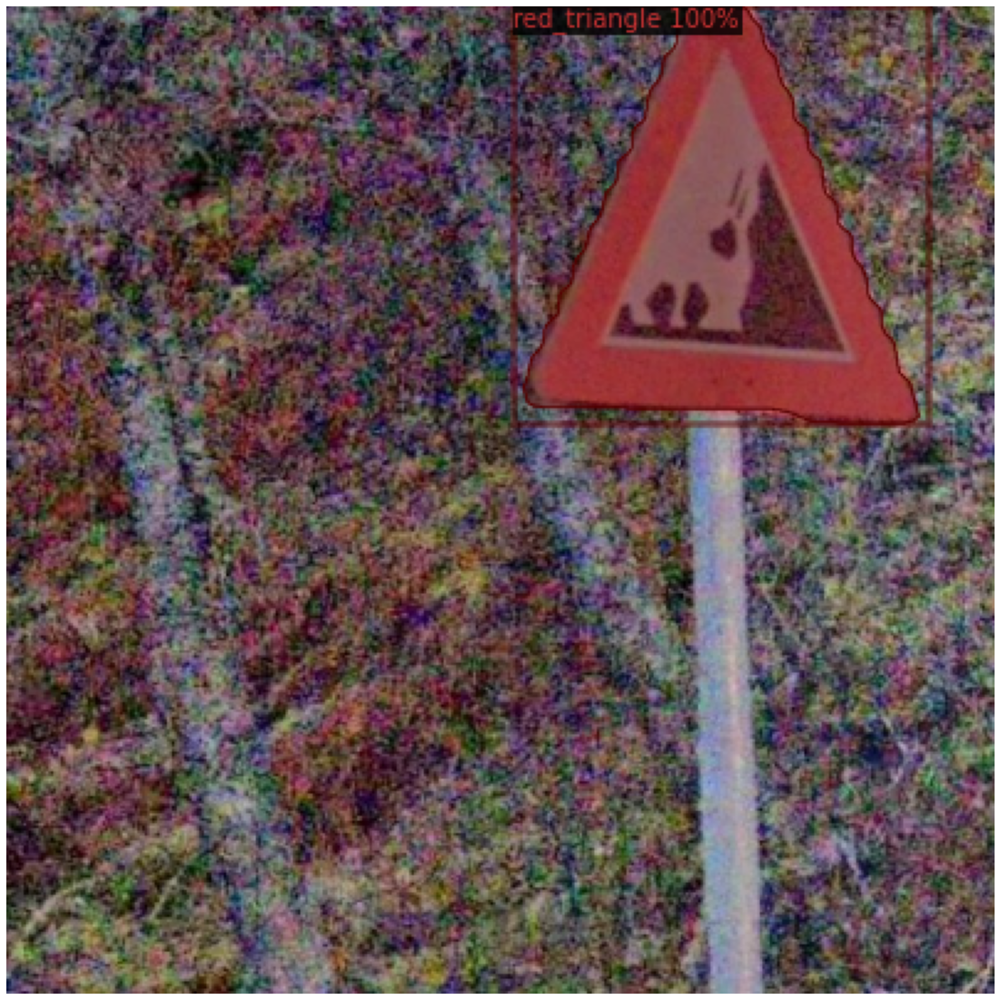

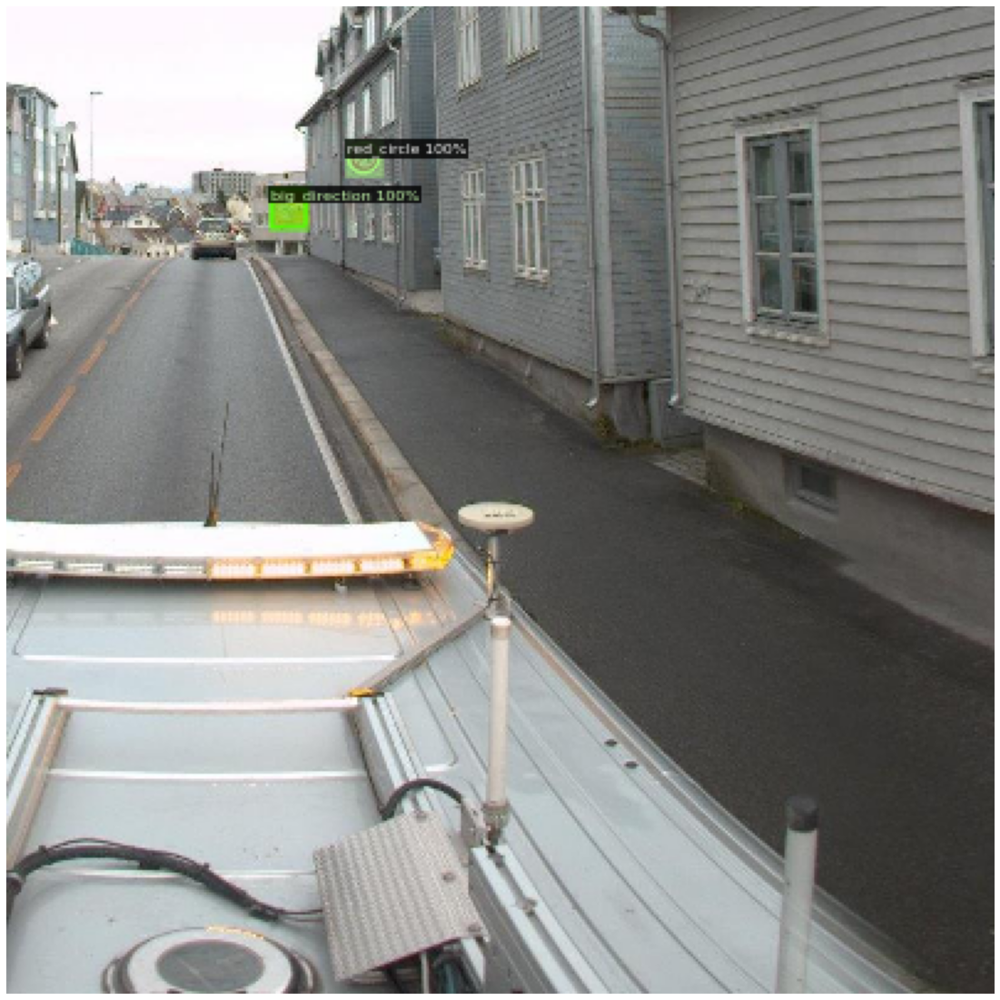

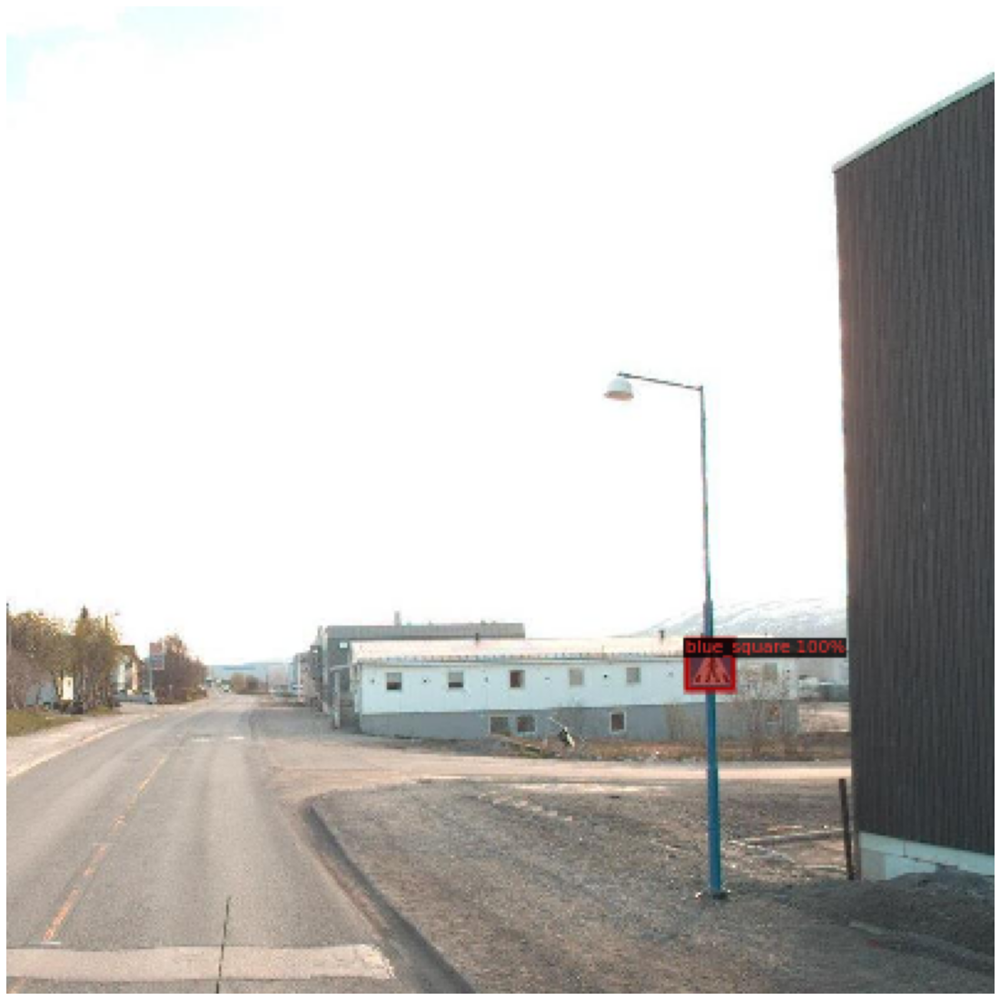

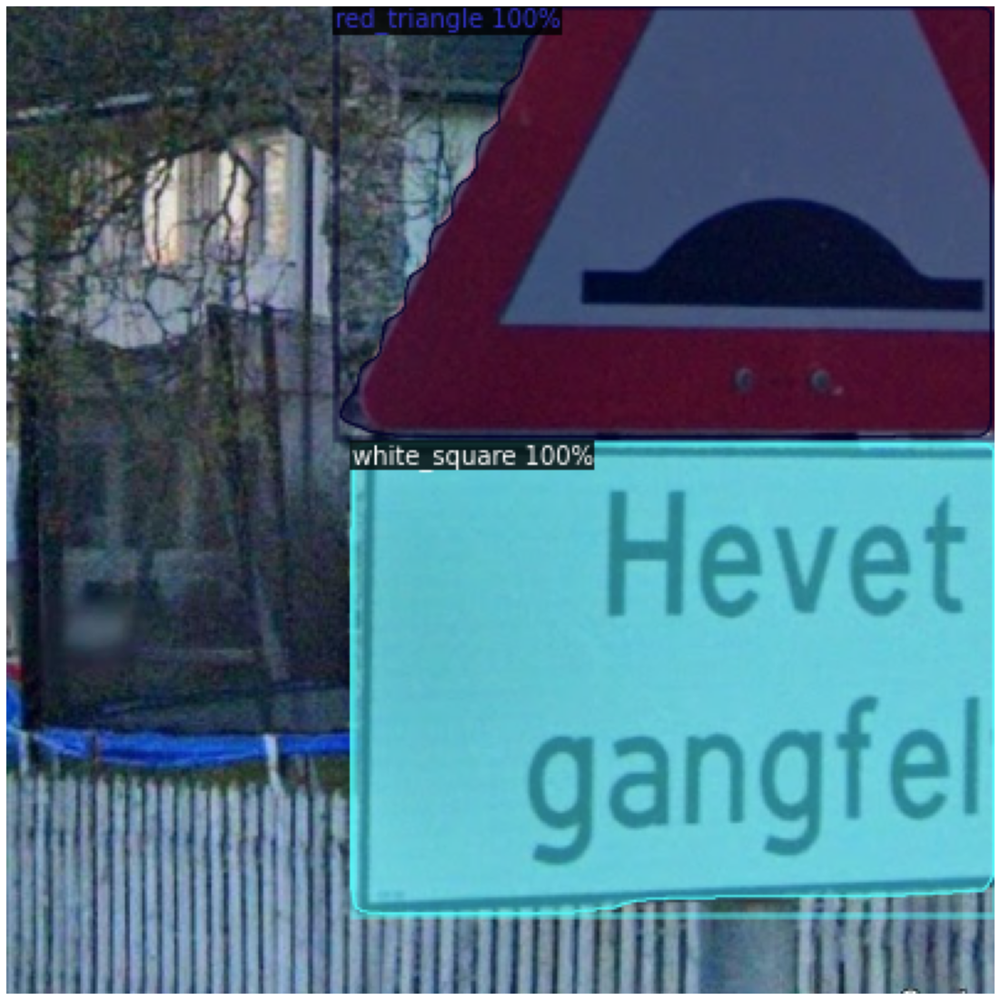

In [48]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("trafficsigns_test")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=trafficsigns_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE  # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [46]:
!python3 grotfjord_sliced_inference.py

09/28/2022 09:21:23 - INFO - detectron2.data.datasets.coco -   Loaded 8598 images in COCO format from /storage/Projects/Fylkesveg/Sign_training_material/training_sahi/labels/train/coco.json
/storage/Projects/notebooks/detectron2/detectron2/output/trafficsigns_X101-FPN/cfg.yaml not available in Model Zoo!
09/28/2022 09:21:33 - INFO - fvcore.common.checkpoint -   [Checkpointer] Loading from /storage/Projects/notebooks/detectron2/detectron2/output/trafficsigns_X101-FPN/model_final.pth ...
  0%|                                                     | 0/9 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100%|█████████████████████████████████████████████| 9/9 [01:13<00:00,  8.15s/it]
